<a href="https://colab.research.google.com/github/ajeetranaut/Assignment/blob/master/tweeter_sentiment_analysis1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from flask import Flask,render_template,url_for,request
import pandas as pd 
import numpy as np
import re
import pickle
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
import joblib as jb

In [ ]:

df=pd.read_csv('C:/Users/KALKAJI/OneDrive/Desktop/train.csv')
df

,PhraseId,SentenceId,Phrase,Sentiment
0,1,1,A series of escapades demonstrating the adage ...,1
1,2,1,A series of escapades demonstrating the adage ...,2
2,3,1,A series,2
3,4,1,A,2
4,5,1,series,2
...,...,...,...,...
156055,156056,8544,Hearst 's,2
156056,156057,8544,forced avuncular chortles,1
156057,156058,8544,avuncular chortles,3
156058,156059,8544,avuncular,2


pip install -U scikit-learn

In [ ]:
df["Phrase"]=df["Phrase"].str.lower()
df.sample(5)

,PhraseId,SentenceId,Phrase,Sentiment
3084,3085,115,young and,2
58506,58507,2948,recommended -- as visually bland as a dentist ...,1
46436,46437,2258,"a neat twist , subtly rendered",3
83960,83961,4338,adrian,2
111068,111069,5887,to work in the same vein as the brilliance of ...,3


In [ ]:
def remove_pat(s1, pat, nstr):
    return re.sub(pat, nstr, s1)
df["new_Phrase"] = np.vectorize(remove_pat)(df["Phrase"], "@[\w]*","")
df.sample(5)

,PhraseId,SentenceId,Phrase,Sentiment,new_Phrase
132533,132534,7146,how many times,2,how many times
133229,133230,7188,is ... very funny as you peek at it through th...,4,is ... very funny as you peek at it through th...
816,817,30,vaudeville,2,vaudeville
123314,123315,6619,if any of them list this ` credit ' on their r...,1,if any of them list this ` credit ' on their r...
104860,104861,5538,'s too much forced drama in this wildly uneven...,1,'s too much forced drama in this wildly uneven...


In [ ]:
df["new_Phrase"] = np.vectorize(remove_pat)(df["Phrase"], "[^a-zA-Z#_]+-"," ")
df.sample(5)

,PhraseId,SentenceId,Phrase,Sentiment,new_Phrase
110555,110556,5860,a keep - 'em -,2,a keep 'em
110813,110814,5871,played and smartly directed .,4,played and smartly directed .
142040,142041,7705,the tiny two seater plane that carried the gia...,2,the tiny two seater plane that carried the gia...
48317,48318,2358,"is considered a star , nor why he keeps being ...",2,"is considered a star , nor why he keeps being ..."
68417,68418,3472,adroit but finally a trifle flat,2,adroit but finally a trifle flat


In [ ]:
def m1(s1,pat):
    return " ".join(re.findall(pat,s1))
df["hash"] = np.vectorize(m1)(df["Phrase"], r"#(\w+)")
df["new_Phrase"] = np.vectorize(remove_pat)(df["new_Phrase"],r"#[a-z]+"," ")
df.sample(5)



,PhraseId,SentenceId,Phrase,Sentiment,new_Phrase,hash
1667,1668,62,particularly,2,particularly,
27855,27856,1279,of `` the kid stays in the picture '',2,of `` the kid stays in the picture '',
128399,128400,6908,sprecher and her screenwriting partner and sis...,3,sprecher and her screenwriting partner and sis...,
24023,24024,1090,drinking,2,drinking,
7326,7327,300,"sadly , though many of the actors throw off a ...",1,"sadly , though many of the actors throw off a ...",


In [ ]:
#pip install wordcloud

In [ ]:
#import matplotlib.pyplot as plt
all_words=' '.join(text for text in df['new_Phrase'])
all_words

"a series of escapades demonstrating the adage that what is good for the goose is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story . a series of escapades demonstrating the adage that what is good for the goose a series a series of escapades demonstrating the adage that what is good for the goose of escapades demonstrating the adage that what is good for the goose escapades demonstrating the adage that what is good for the goose demonstrating the adage demonstrating the adage the adage that what is good for the goose that what is good for the goose what is good for the goose is good for the goose good for the goose for the goose goose is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story . is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story is also also good for the gander , some of which occasionally amuses but none of

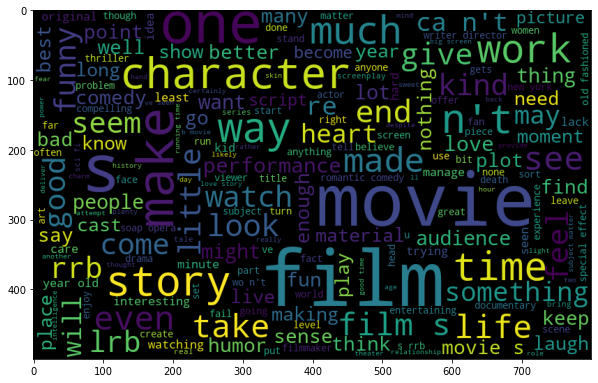

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
wordcloud=WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud)
plt.show()


In [ ]:
import matplotlib.pyplot as plt
df2=df['new_Phrase'][df["Sentiment"]==0]
all_words=' '.join([text for text in df2])


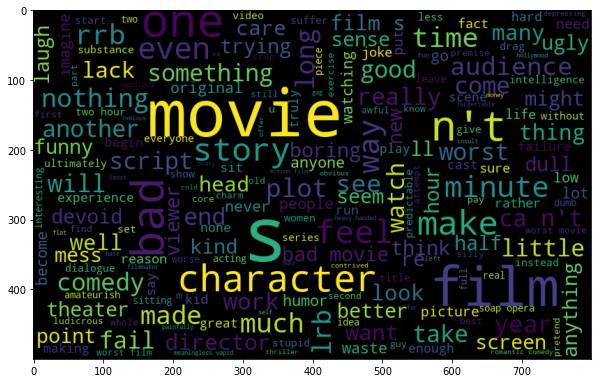

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
wordcloud=WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
df3=df['new_Phrase'][df["Sentiment"]==1]
all_words=' '.join([text for text in df3])

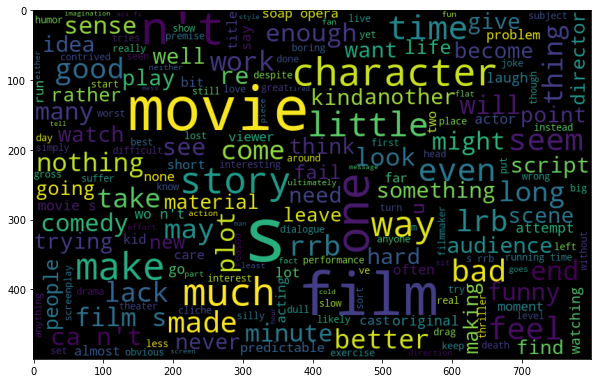

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
wordcloud=WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
df4=df['new_Phrase'][df["Sentiment"]==2]
all_words=' '.join([text for text in df4])

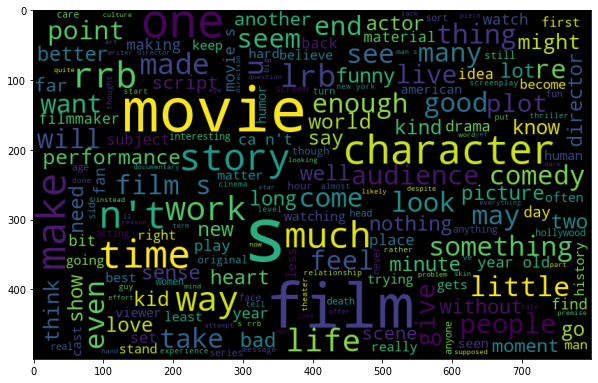

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
wordcloud=WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
df4=df['new_Phrase'][df["Sentiment"]==3]
all_words=' '.join([text for text in df4])

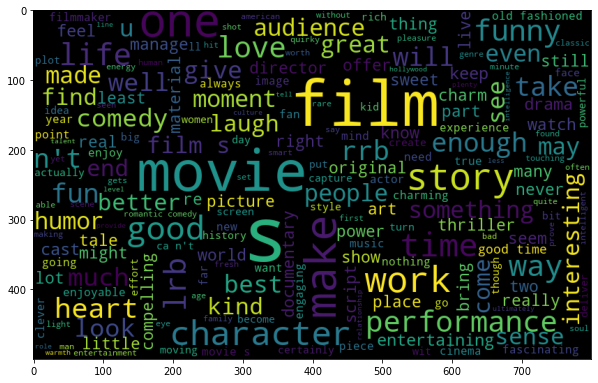

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
wordcloud=WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
df5=df['new_Phrase'][df["Sentiment"]==4]
all_words=' '.join([text for text in df5])

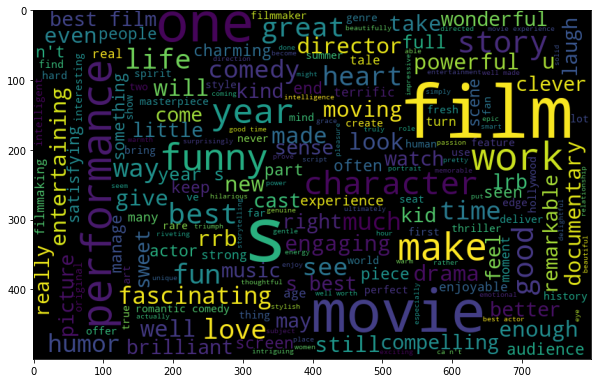

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
wordcloud=WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud)
plt.show()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
#tokenizer to remove unwanted elements from out data like symbols and numbers
token = RegexpTokenizer(r'[a-zA-Z0-9]+')
cv = CountVectorizer(lowercase=True,stop_words='english',ngram_range = (1,1),tokenizer = token.tokenize)
text_counts= cv.fit_transform(df['new_Phrase'])

In [ ]:
df["new_Phrase"].sample(5)

132867    a venturesome , beautifully realized psycholog...
16511                                                voyeur
112782                             with on any deeper level
53177                                  's an ambitious film
133808                                contemptible imitator
Name: new_Phrase, dtype: object

In [ ]:
#store reviews and sentiments as array
text,y= df.new_Phrase,df.Sentiment

In [ ]:
#split the data into train and test at a ratio of 70:30
from sklearn.model_selection import train_test_split
text_train,text_test, y_train,y_test=train_test_split(text,y,test_size=0.30,random_state=42)

In [ ]:
#explain train and test data
import numpy as np
np.unique(y_train)
np.unique(y_test)
print("samples per sentiment(training):{}".format(np.bincount(y_train)))
print("samples per sentiment(testing):{}".format(np.bincount(y_test)))

samples per sentiment(training):[ 4959 19045 55994 22886  6358]
samples per sentiment(testing):[ 2113  8228 23588 10041  2848]


In [ ]:
from nltk import ngrams

In [ ]:
# feature Extraction 
# Rescaling the data with tf-idf
from sklearn.feature_extraction.text import TfidfVectorizer
def tfidf_extractor(corpus,ngram=(1,1)):
    vectorizer=TfidfVectorizer(max_df=0.90,
                                min_df=2,
                               max_features=100000,
                               lowercase=True,
                               token_pattern='(?u)\\b\\w\\w+\\b',
                              norm='l2',
                               stop_words={'english'},
                               analyzer='word',
                              smooth_idf=True,
                              use_idf=True,
                              ngram_range=(1,2))
    features=vectorizer.fit_transform(corpus)
    return vectorizer,features


In [ ]:
tfidf_vectorizer,tfidf_train_features=tfidf_extractor(text_train)
tfidf_test_features=tfidf_vectorizer.transform(text_test)

In [ ]:
from sklearn import metrics

In [ ]:

def get_metrics(true_labels, predicted_labels):
    print ('Accuracy:', np.round(metrics.accuracy_score(true_labels,predicted_labels),5))
    print ('Precision:', np.round(metrics.precision_score(true_labels,predicted_labels,average='weighted'),5))
    print ('Recall:', np.round(metrics.recall_score(true_labels, predicted_labels,average='weighted'),5))
    print ('F1 Score:', np.round(metrics.f1_score(true_labels, predicted_labels,average='weighted'),5))

In [ ]:
def train_predict_evaluate_model(classifier,train_features, train_labels, test_features, test_labels):
    # build model    
    classifier.fit(train_features, train_labels)
    # predict using model
    predictions = classifier.predict(test_features) 
    # evaluate model prediction performance   
    get_metrics(true_labels=test_labels, 
                predicted_labels=predictions)
    return predictions

Multinomial Naive Bayes with tfidf features

In [ ]:
from sklearn.naive_bayes import MultinomialNB

In [ ]:
mnb_best = MultinomialNB(alpha = 0.1,fit_prior = True)

In [ ]:
mnb_tfidf_predictions = train_predict_evaluate_model(classifier=mnb_best,
                                           train_features=tfidf_train_features,
                                           train_labels=y_train,
                                           test_features=tfidf_test_features,
                                           test_labels=y_test)

Accuracy: 0.61352
Precision: 0.61024
Recall: 0.61352
F1 Score: 0.61169


In [ ]:
cm = metrics.confusion_matrix(y_test, mnb_tfidf_predictions)
pd.DataFrame(cm, index=range(0,5), columns=range(0,5))

,0,1,2,3,4
0,827,990,266,25,5
1,790,4130,2996,282,30
2,293,2740,17327,2952,276
3,39,344,3368,5257,1033
4,1,29,263,1372,1183


In [ ]:
import sklearn
sklearn.__version__

'0.23.2'

Incorrect Predictions

In [ ]:
import re
print ("*******[0 - negative,1 - somewhat negative,2 - neutral,3 - somewhat positive, 4 - positive]*******")
for document, label, predicted_label in zip(text_test, y_test, mnb_tfidf_predictions):
    for i in range(0,4):
        if label == i and predicted_label != i:
            print ("Actual Label:", +label)
            print ("Predicted Label:", +predicted_label)
            print ("Review:", re.sub('\n', ' ', document))

*******[0 - negative,1 - somewhat negative,2 - neutral,3 - somewhat positive, 4 - positive]*******
Actual Label: 1
Predicted Label: 3
Review: thoughtful without having much dramatic impact
Actual Label: 2
Predicted Label: 1
Review: fusty
Actual Label: 2
Predicted Label: 3
Review: driven
Actual Label: 1
Predicted Label: 2
Review: a reluctant , irresponsible man and
Actual Label: 2
Predicted Label: 3
Review: , aching sadness
Actual Label: 2
Predicted Label: 1
Review: a more generic effort in the genre
Actual Label: 2
Predicted Label: 1
Review: for this sort of thing to work , we need agile performers
Actual Label: 1
Predicted Label: 2
Review: cheap shocks
Actual Label: 1
Predicted Label: 2
Review: is amiss in the world .
Actual Label: 0
Predicted Label: 2
Review: director hoffman , his writer and kline 's agent should serve detention
Actual Label: 3
Predicted Label: 4
Review: technically superb film
Actual Label: 3
Predicted Label: 4
Review: an undeniably moving film to experience
Actual

persist model in a standard format

In [ ]:
import joblib as jb

pip install joblib

In [ ]:
jb.dump(mnb_best, 'sent_anay_model.pkl')

['sent_anay_model.pkl']

In [ ]:
sent_anay_model = open('sent_anay_model.pkl','rb')
mnb_best = jb.load(sent_anay_model)